# Helsinki area home prices EDA

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting

from scipy import stats
from scipy.stats import norm, skew #for some statistics

pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) #Limiting floats output to 3 decimal points

import plotly.express as px

# Own function
from helpers import process_data, sortList

import plotly.io as pio

usecolors = [x for x in pio.templates['niinasown']['layout']['colorway']]
pio.renderers.default = "notebook_connected"

import seaborn as sns
sns.set_palette(sns.color_palette(usecolors))

# Read data

In [2]:
df = pd.read_csv('../data/house_data.csv')
df.head()

,Item_id,House_type,Area,City,Price,Size,Year_build,Item_fetched,Latitude,Longitude,Condition,Dist_to_Hki_center,See_view,Subway,Total_size,Plot,Elevator
0,10001214,Block of flats,Leppävaara,Espoo,184800.000,32.000,2024.000,2022-05-14,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
1,10001215,Block of flats,Leppävaara,Espoo,182500.000,30.500,2024.000,2023-01-07,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
2,10001221,Block of flats,Leppävaara,Espoo,406700.000,67.500,2024.000,2023-01-07,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
3,10001224,Block of flats,Leppävaara,Espoo,427400.000,67.500,2024.000,2022-02-26,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
4,10001226,Block of flats,Leppävaara,Espoo,544900.000,84.000,2024.000,2022-04-16,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000


The data has been scraped from etuovi on several days. Let's see what is the time period

In [3]:
print(df.Item_fetched.min())
print(df.Item_fetched.max())

2022-02-04
2023-04-01


# 4. Formats and some more cleaning of data
Formatting is done using a helper function which is used also in the model training notebook.

In [4]:
help(process_data)

Help on function process_data in module helpers:

process_data(df)
    Format Item_fetched, restrict price range and remove too cheap new homes



In [5]:
df = process_data(df)
df.head()

,Item_id,House_type,Area,City,Price,Size,Year_build,Item_fetched,Latitude,Longitude,Condition,Dist_to_Hki_center,See_view,Subway,Total_size,Plot,Elevator
0,10001214,Block of flats,Leppävaara,Espoo,184800.000,32.000,2024.000,2022-05-14,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
1,10001215,Block of flats,Leppävaara,Espoo,182500.000,30.500,2024.000,2023-01-07,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
2,10001221,Block of flats,Leppävaara,Espoo,406700.000,67.500,2024.000,2023-01-07,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
3,10001224,Block of flats,Leppävaara,Espoo,427400.000,67.500,2024.000,2022-02-26,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000
4,10001226,Block of flats,Leppävaara,Espoo,544900.000,84.000,2024.000,2022-04-16,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000


# 5 Add build decade for visualization

In [6]:
df['Build_decade'] = df['Year_build'].round(-1)
df.loc[df['Build_decade'].notna(),'Build_decade'] = df.loc[df['Build_decade'].notna(),'Build_decade'].astype(int).astype(str)
df.head()

,Item_id,House_type,Area,City,Price,Size,Year_build,Item_fetched,Latitude,Longitude,Condition,Dist_to_Hki_center,See_view,Subway,Total_size,Plot,Elevator,Build_decade
0,10001214,Block of flats,Leppävaara,Espoo,184800.000,32.000,2024.000,2022-05-14,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000,2020
1,10001215,Block of flats,Leppävaara,Espoo,182500.000,30.500,2024.000,2023-01-07,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000,2020
2,10001221,Block of flats,Leppävaara,Espoo,406700.000,67.500,2024.000,2023-01-07,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000,2020
3,10001224,Block of flats,Leppävaara,Espoo,427400.000,67.500,2024.000,2022-02-26,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000,2020
4,10001226,Block of flats,Leppävaara,Espoo,544900.000,84.000,2024.000,2022-04-16,60.223,24.841,Good,13460.534,0.000,0,NaN,Rented,1.000,2020


# 6. Investiage relationships
## 6.1 Relationship with categorical features

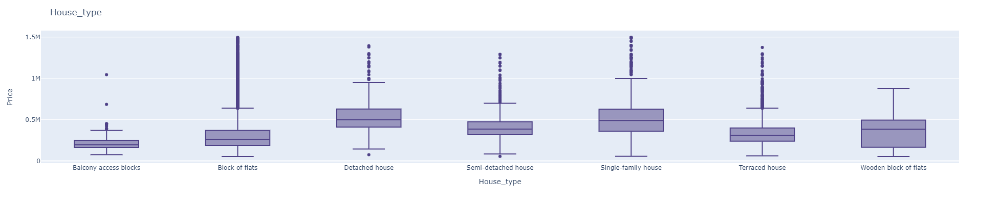

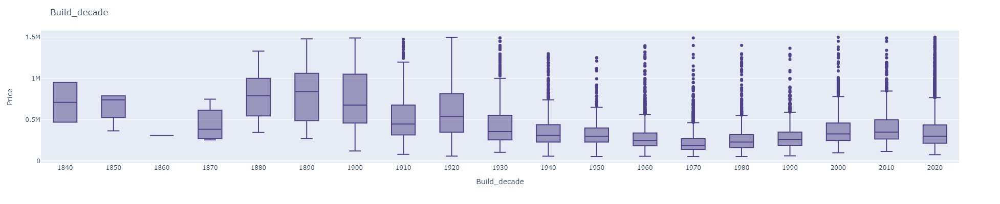

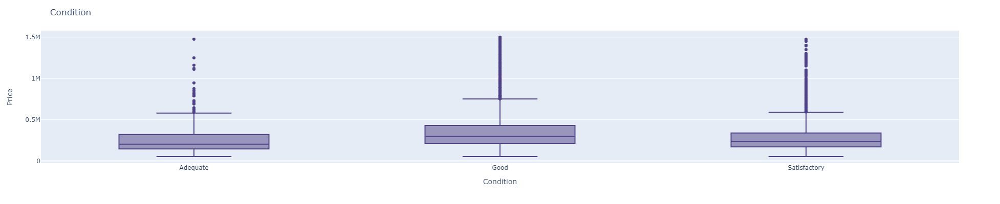

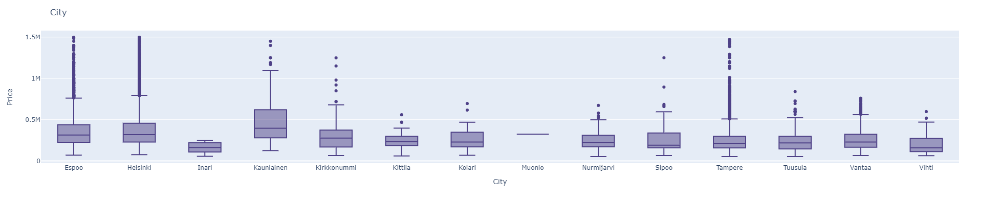

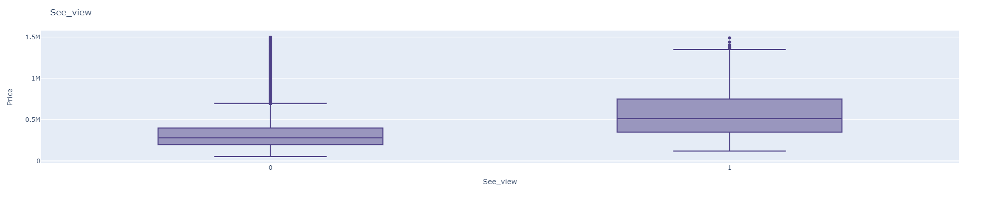

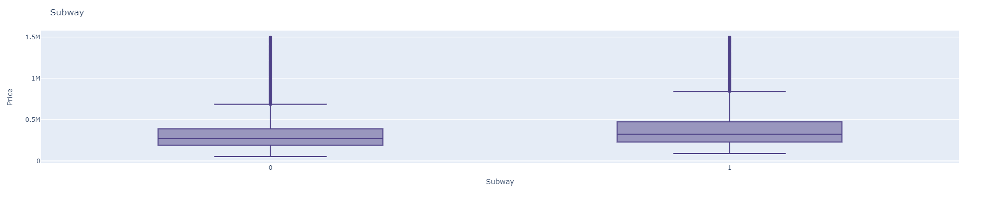

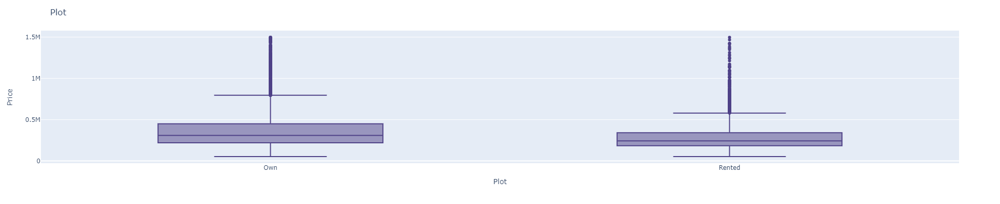

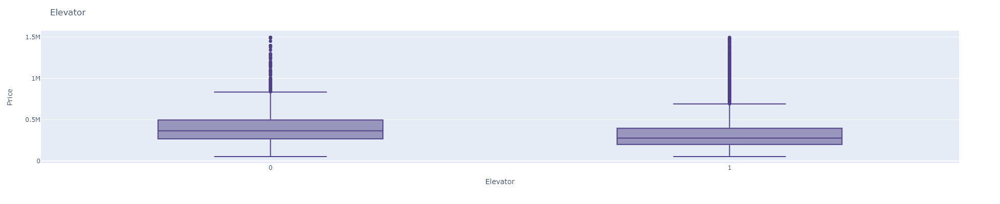

In [8]:
catfeat = ['Area', 'Build_decade', 'House_type','Condition','City',
          'See_view','Subway','Plot','Elevator']

orders = {}
for var in catfeat:
    lista = df[var].unique().tolist()
    lista = sortList(lista)
    orders[var] = lista
    
for var in ['House_type','Build_decade','Condition','City','Item_fetched',
           'See_view', 'Subway', 'Plot', 'Elevator']:
    data = pd.concat([df['Price'], df[var]], axis=1)
    if var in orders.keys():
        fig = px.box(x=data[var], y=data["Price"],
                    color_discrete_sequence=pio.templates['niinasown']['layout']['colorway']
                    )
        fig.update_layout(title = var,
                          width = 750, 
                          height = 400,
                          xaxis_title=var,
                          yaxis_title="Price"
                         )
        fig.update_xaxes(categoryorder = 'array', categoryarray = orders[var])
        fig.show()
        print()

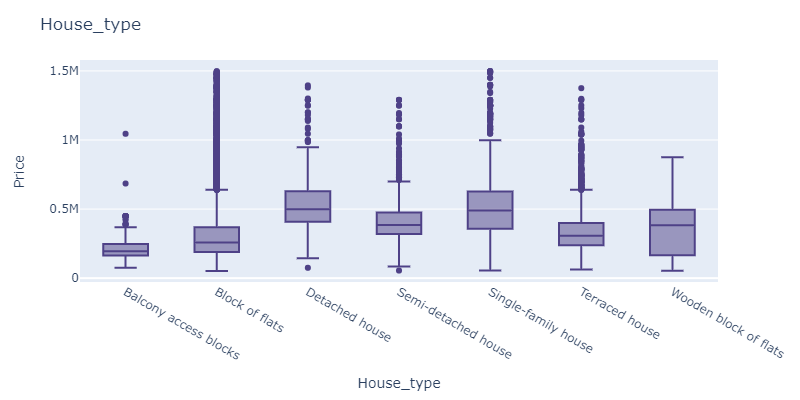

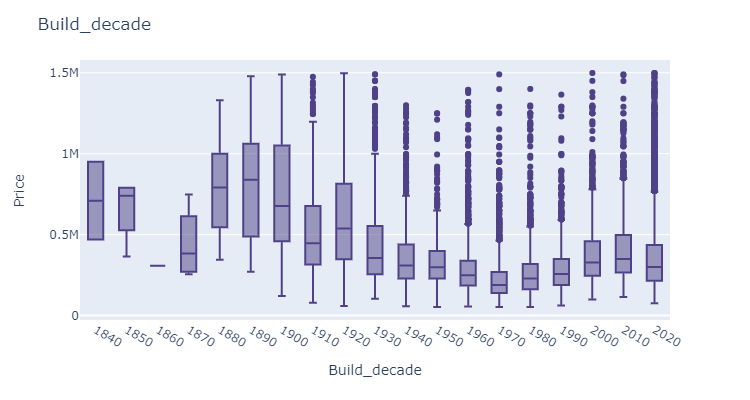

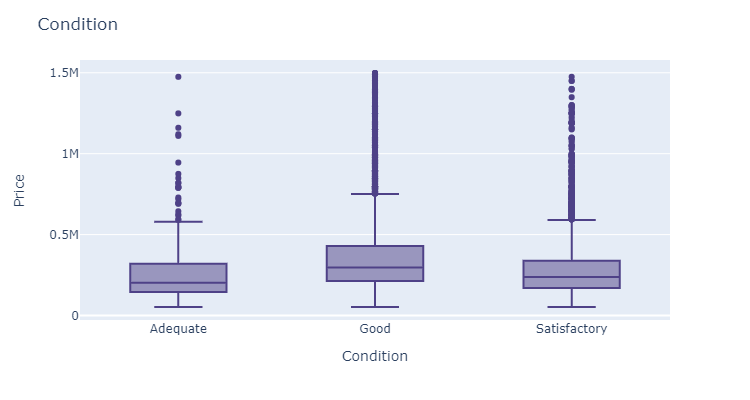

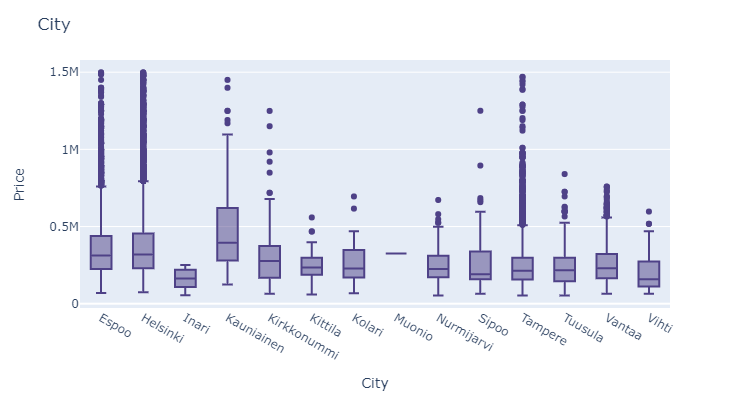

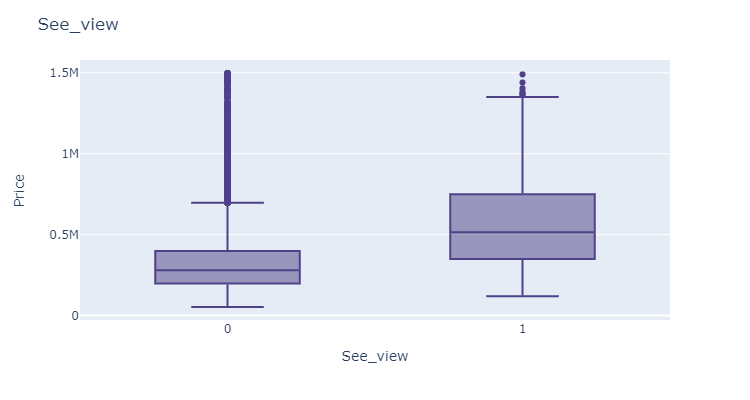

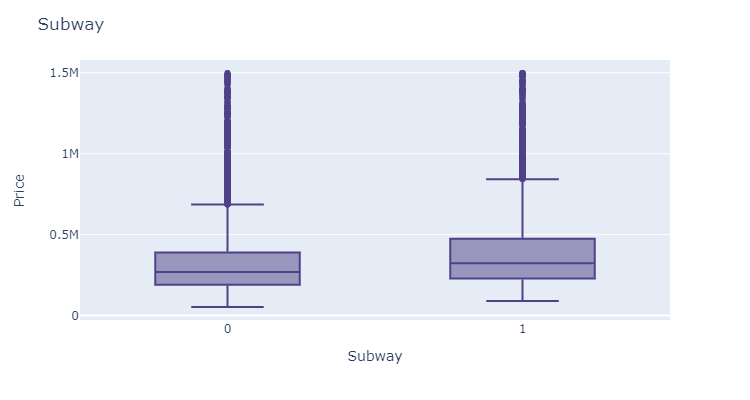

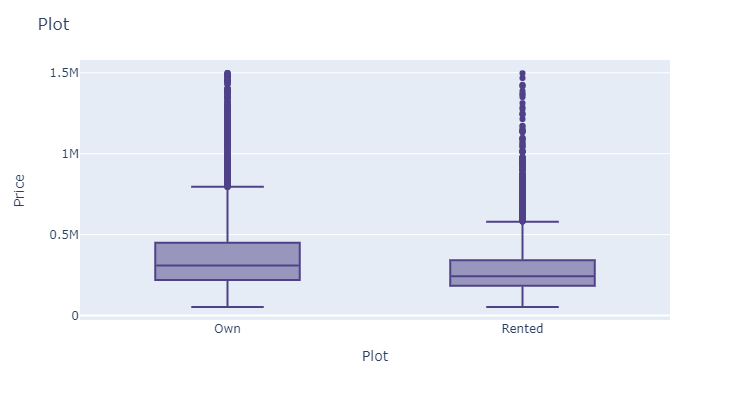

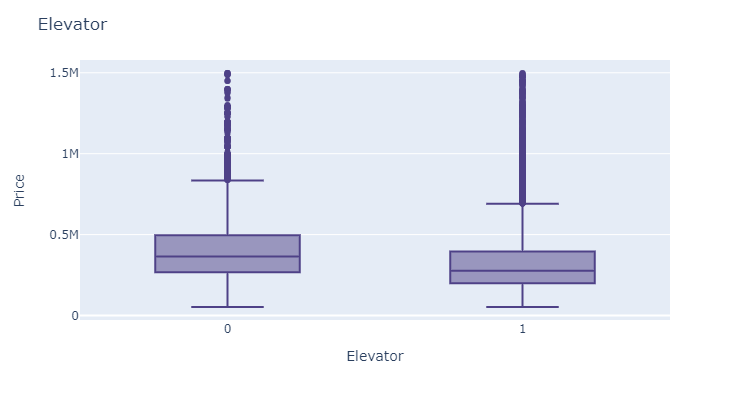

Apartments in 19th century houses seem to be more expensive. Most of the so old buildings are in Helsinki down town so it makes sense. 

As expected, the average price of detached houses and single-family houses is higher than in other house types and the codition of the home also makes a difference. The average price of homes with see view is clearly higher than of other homes which is also expected.

There seems to be some difference in the average price depending on the closeness of a subway station (distance less than 1 km) or own plot, but not very big.

The average price of houses with elevator is lower than in those without. Elevator is only relevant in blocks of flats which are on average cheaper, so the result is consistent with house-type results (the number of balcony access blocks is rather small).

## 6.3 Correlation matrix (heatmap style)

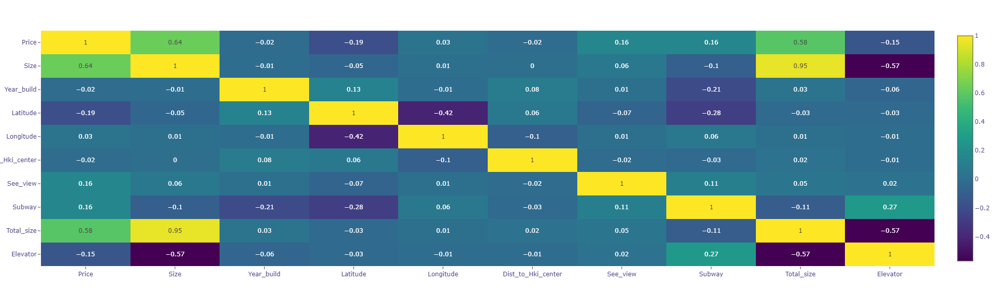

In [9]:
corrmat = df.corr().round(2)

fig = px.imshow(corrmat, text_auto=True, aspect="auto",
         template=pio.templates['niinasown']
         )
fig.update_layout(
    showlegend = False,
    width = 750, height = 600,
    autosize = False )

fig.show()

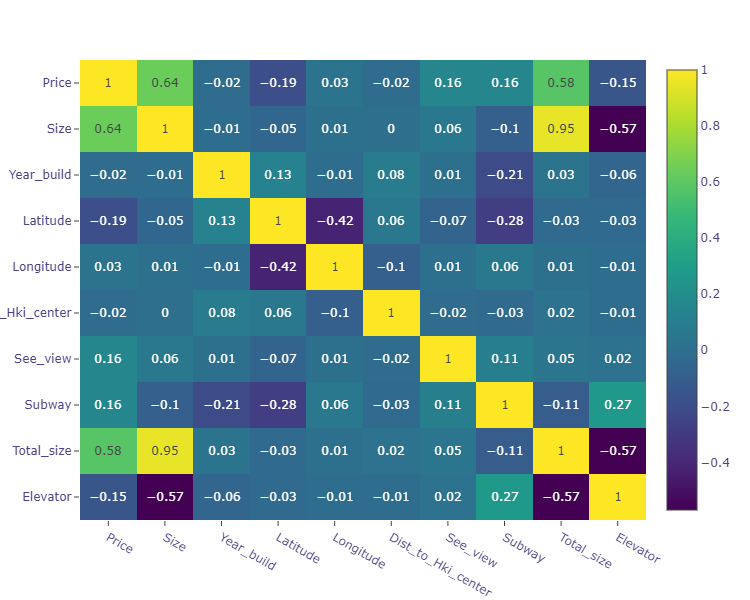

Size, meaning the living area, and Total_size seem to be the most correlated variables with the price

### 6.3.1 Scatter plots between 'Price' and correlated variables

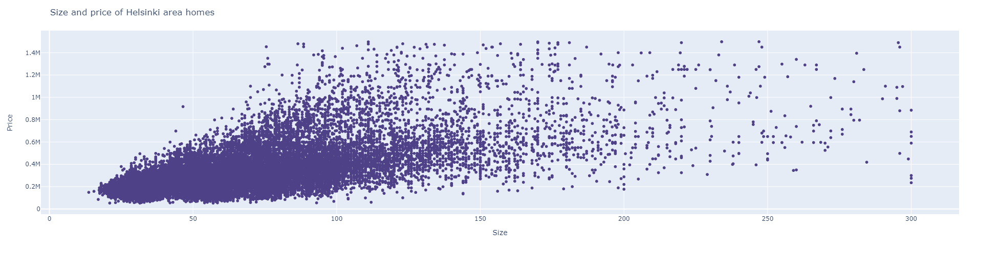

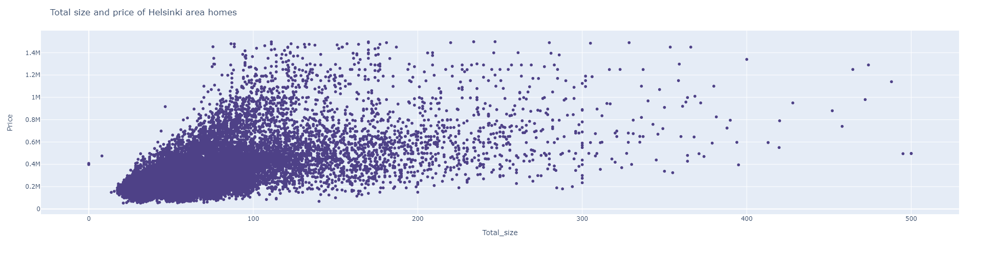

In [11]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

for feat in ['Size','Total_size']:
    fig = px.scatter(df, x=feat, y= 'Price',
                color_discrete_sequence = pio.templates['niinasown']['layout']['colorway']
                )
    fig.update_layout(
        width = 750, height = 500,
        title = feat.replace('_',' ') + ' and price of Helsinki area homes'
        )
    fig.show()

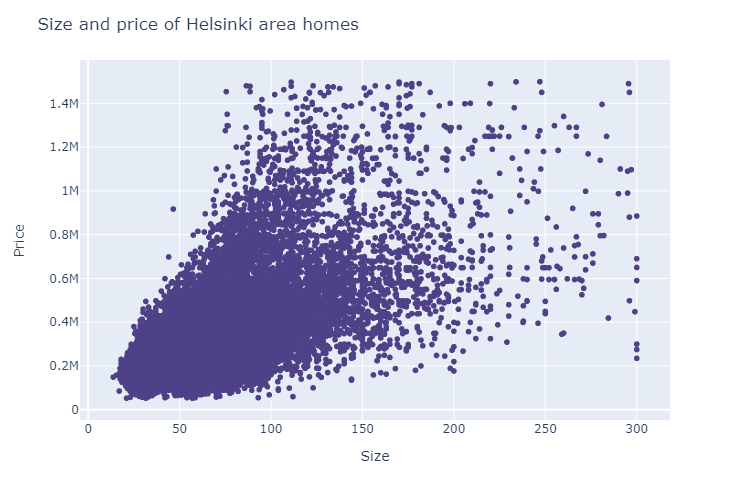

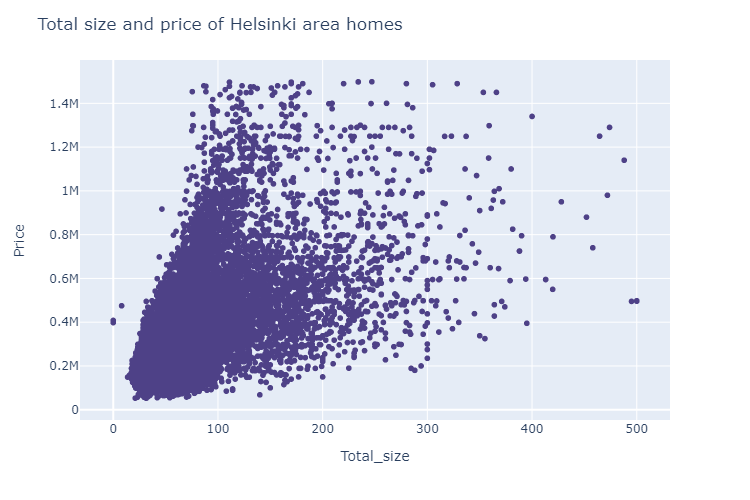

# 7. Target Variable

**Price** is the variable we need to predict. So let's do some analysis on this variable first.


 mu = 337994.19 and sigma = 207912.13



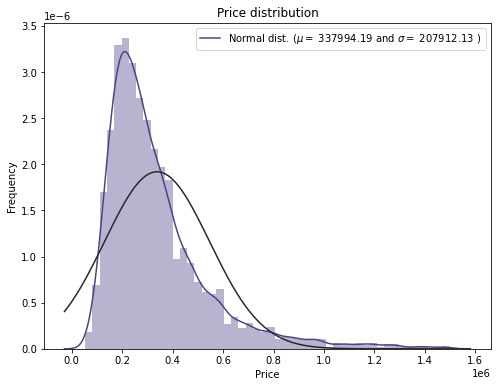

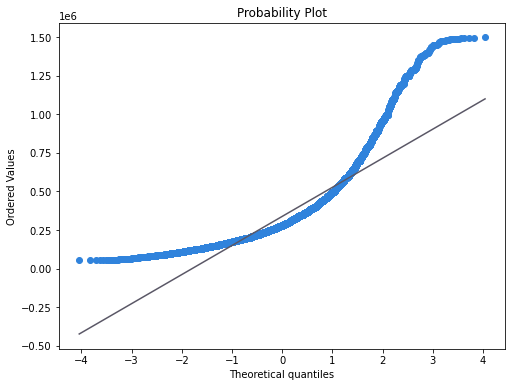

In [12]:
plt.figure(figsize=(8, 6))
fig1 = sns.distplot(df['Price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Price distribution')

#Get also the QQ-plot
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)

res = stats.probplot(df['Price'], plot=plt)

ax.get_lines()[0].set_markerfacecolor(usecolors[1])
ax.get_lines()[0].set_markeredgecolor(usecolors[1])
ax.get_lines()[1].set_color(usecolors[6])

plt.show()

The target variable is skewed.  As (linear) models love normally distributed data, we need to transform this variable and make it more normally distributed.

 ## 7.1 Log-transformation of the target variable


 mu = 12.58 and sigma = 0.53



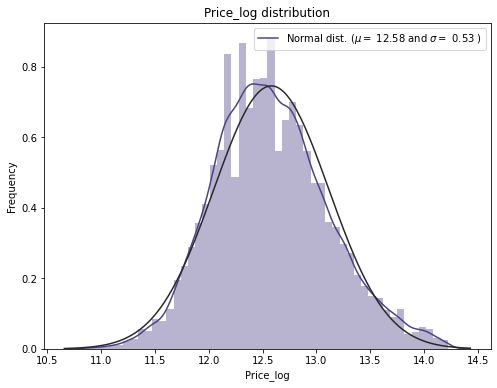

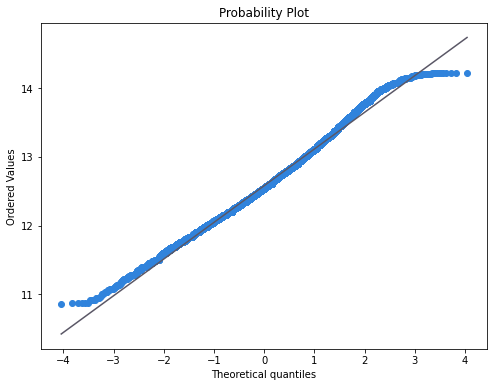

In [13]:
plt.figure(figsize=(8, 6))
# Price can not be zero
df["Price_log"] = np.log(df["Price"])

#Check the new distribution 
sns.distplot(df['Price_log'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Price_log'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Price_log distribution')

#Get also the QQ-plot
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)

res = stats.probplot(df['Price_log'], plot=plt)
ax.get_lines()[0].set_markerfacecolor(usecolors[1])
ax.get_lines()[0].set_markeredgecolor(usecolors[1])
ax.get_lines()[1].set_color(usecolors[6])

plt.show()

Transformation seem to work ok. But we'll leave the transformation to the modelling phase.